In [ ]:
import torch 
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np 
import math 
from torchvision import datasets

batch_size = 25

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(device)

cuda:0


In [ ]:
# import shutil
# shutil.rmtree('emociones')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Data path

In [ ]:
path_p = 'drive/MyDrive/Proyectos/data/data'

#Preprocessing

### Cluster in folders and cut
* Only cute the faces

In [ ]:
# Se crea los folders
import shutil
import os
emociones = ['a', 'd', 'f', 'h', 'n', 's']
emociones_label = ['angry', 'disgust', 'fear', 'happy', 'neutral', 'sad']
files = ['emociones']
for i in files:
 os.mkdir(i)
for i in emociones:
  os.mkdir(files[0] + '/' + i)
out = os.listdir(path_p)

FileExistsError: ignored

In [ ]:
!pip install mtcnn

In [ ]:
from mtcnn import MTCNN
from PIL import Image
import numpy as np
def extract_face(filename, final_file, required_size=(255, 255)):
  image = Image.open(filename)
  image = image.resize(required_size) 
  image = image.convert('RGB')
  pixels = np.asarray(image)
  # create the detector, using default weights
  detector = MTCNN()
  # detect faces in the image
  results = detector.detect_faces(pixels)
  x1, y1, width, height = results[0]['box']
  x1, y1 = abs(x1), abs(y1)
  x2, y2 = x1 + width, y1 + height

  face = pixels[y1:y2, x1:x2]
  image = Image.fromarray(face)
  image = image.resize(required_size)
  face_array = np.asarray(image)
  img = Image.fromarray(face_array, 'RGB')
  img.save(final_file)


In [ ]:
path =  'emociones'
for i in out:
  extract_face(path_p + '/' + i, path + '/' + i[8] + '/' +i)

#Processing

## Architecture

In [ ]:
#hypengrparameter 
learning_rate =  0.0005

class CNN(nn.Module):
    def __init__(self, num_classes=2):
        super(CNN, self).__init__()
        self.layer1 = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=11, stride=2, padding=5),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2))
        self.layer2 = nn.Sequential(
            nn.Conv2d(32, 32, kernel_size=7, stride=1, padding=3),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2))
        self.layer3 = nn.Sequential(
            nn.Conv2d(32, 32, kernel_size=5, stride=1, padding=2),
            nn.Dropout(0.4),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2))
        self.layer4 = nn.Sequential(
            nn.Conv2d(32, 32, kernel_size=5, stride=1, padding=2),
            nn.Dropout(0.4),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2))
        self.layer5 = nn.Sequential(
            nn.Conv2d(32, 32, kernel_size=3, stride=1, padding=1),
            nn.Dropout(0.4),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2))
        #self.layer6 = nn.Sequential(
        #    nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=0),
        #    nn.ReLU(),
        #    nn.MaxPool2d(kernel_size=2, stride=2))
        self.fc = nn.Sequential(
            nn.Linear(512 , 64),
            nn.ReLU(),
            nn.Linear(64, 16),
            nn.ReLU(),
            nn.Linear(16, num_classes))
        
        #self.fc = nn.Linear(256, num_classes)
    def forward(self, x):
        out = self.layer1(x)
        out = self.layer2(out)
        out = self.layer3(out)
        out = self.layer4(out)
        out = self.layer5(out)
        #out = self.layer6(out)
        out = out.reshape(out.size(0), -1)
        out = self.fc(out)
        return out

####Test function

In [ ]:
def test(model):
  with torch.no_grad():
      correct = 0
      total = 0
      for images, labels in test_loader:
          images = images.to(device)
          labels = labels.to(device)
          outputs = model(images)
          _, predicted = torch.max(outputs.data, 1)
          total += labels.size(0)
          correct += (predicted == labels).sum().item()
      print('Test Accuracy: {} %'.format(100 * correct / total))

####Train function

In [ ]:
def train(model, optimizer, loos_fn, num_epochs):
  loss_vals = []
  running_loss =0.0
  # train the model
  total_step = len(train_loader)

  list_loss= []
  list_time = []
  j=0
  max_test = 0

  for epoch in range(num_epochs):
    for i, (images, labels) in enumerate(train_loader):
      images = images.to(device)
      labels = labels.to(device)
      # forward 
      output = model(images)
      loss   = loss_fn(output, labels)
      # change the params
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()

      list_loss.append(loss.item())
      list_time.append(j)
      j+=1
              
      if (i+1) % 2 == 0:
              print ('Epoch [{}/{}], Step [{}/{}], Loss: {:.4f}' 
                    .format(epoch+1, num_epochs, i+1, total_step, loss.item()))
    # if (epoch+1) % 4 == 0:
    #   a = test(model)
    # if (epoch+1) % 10 == 0:
    #   if a > max_test:
    #     max_test = a
    if loss.item() < 0.01:
      break
  print('Finished Training Trainset with max_test of ',max_test)
  return list_loss

####Another functions

In [ ]:
def Show_imgs(imgs, name,  size = 3, color = True):
  color_m ='jet'
  if color == False:
    color_m ='gray'
  print('******************' + name  +  '**************************')
  img_numbers = imgs.shape[0]
  rows = cols = math.ceil(np.sqrt(img_numbers))
  
  fig = plt.figure(figsize=(rows*size, cols*size))
  for i in range(0, rows*cols):
    fig.add_subplot(rows, cols,i+1)
    if i<img_numbers:
      plt.imshow(imgs[i].detach(), cmap = 'gray')
  plt.show()

In [ ]:
def Show(out, title = ''):
  print(title)
  out = out.permute(1,0,2,3)
  grilla = torchvision.utils.make_grid(out)
  plt.imshow(transforms.ToPILImage()(grilla), 'jet')
  plt.show()

def Show_Weight(out):
  grilla = torchvision.utils.make_grid(out)
  plt.imshow(transforms.ToPILImage()(grilla), 'jet')
  plt.show()

#Expeimentation

# image validation

In [ ]:
def validar_imagen(filename):
  os.mkdir('new_test_tmp')
  os.mkdir('new_test_tmp/0')
  extract_face('new_test/' + filename,'new_test_tmp/0/' + filename)
  exotic_set = torchvision.datasets.ImageFolder('new_test_tmp/',
                        transform = transforms.Compose([transforms.Resize(255),  
                                                                           transforms.CenterCrop(255),
                                                                           transforms.ColorJitter(brightness=0.4, contrast= 0.8),
                                                                           transforms.ToTensor()])) 
#  shutil.rmtree('exotic_test2')
  n_test = 0
  dataset_to_process = exotic_set
  if torch.no_grad():
    model.to('cpu')
    img, label = dataset_to_process[n_test]
    img = img.unsqueeze(0)
    out = model(img)
    _, predicted = torch.max(out.data, 1)
    print ('Prediction and label: ',predicted,' - ', label)
    
    out = model.layer1[0](img)
    Show(out, 'layer 1: Convolution output')
    out = model.layer1[1](out)
    Show(out, 'layer 1: Activation function output')
    out = model.layer1[2](out)
    Show(out, 'layer 1: Max-Pooling')
    
    
    out = model.layer2[0](out)
    Show(out, 'layer 2: Convolution output')
    out = model.layer2[1](out)
    Show(out, 'layer 2: Activation function output')
    out = model.layer2[2](out)
    Show(out, 'layer 2: Max-Pooling')

    out = model.layer3[0](out)
    Show(out, 'layer 3: Convolution output')
    out = model.layer3[1](out)
    out = model.layer3[2](out)
    Show(out, 'layer 3: Activation function output')
    out = model.layer3[3](out)
    Show(out, 'layer 3: Max-Pooling')

    out = model.layer4[0](out)
    Show(out, 'layer 4: Convolution output')
    out = model.layer4[1](out)
    out = model.layer4[2](out)
    Show(out, 'layer 4: Activation function output')
    out = model.layer4[3](out)
    Show(out, 'layer 4: Max-Pooling')

    out = model.layer5[0](out)
    Show(out, 'layer 5: Convolution output')
    out = model.layer5[1](out)
    out = model.layer5[2](out)
    Show(out, 'layer 5: Activation function output')
    out = model.layer5[3](out)
    Show(out, 'layer 5: Max-Pooling')

    out = out.reshape(out.size(0), -1)
    out = model.fc(out)
    print(out)
    out = Softm(out)
    img, label = dataset_to_process[n_test]
    name_of_test ="test n° " + str(n_test)
    Show_imgs(img, name_of_test)
    print('Emotion: ',emociones_label[torch.max(out.data, 1)[1]],'.')
    print('Prediction is {',torch.max(out.data, 1)[1],'} and label is {',label,'}')
  shutil.rmtree('new_test_tmp')
  

In [ ]:
import random
random.seed(50)

* We use Color Jitter to add contrast and make the facial expressions more prominent



In [ ]:
from torchvision.utils import save_image
dataset = torchvision.datasets.ImageFolder('emociones/',
                   
                        transform = transforms.Compose([transforms.Resize(255),  
                                                                           transforms.CenterCrop(255),
                                                                           transforms.ColorJitter(brightness=0.4, contrast= 0.9),
                                                                           transforms.ToTensor()])) 
#dataloader = torch.utils.data.DataLoader(dataset, batch_size=25, shuffle=False)
len_data = len(dataset)
num_classes = 6
proportion = 70
min_train = 7

a = True
label_list = []
count_list = []
attemps = 0
while (a):
  label_list = []
  count_list = []
  train_set, test_set = torch.utils.data.random_split(dataset, [int(len_data*proportion/100),len_data - int(len_data*proportion/100)])
  for i in train_set:
    label_list = label_list + [i[1]]
  for j in range(num_classes):
    count_list = count_list + [label_list.count(j)]
  contador = 0
  for k in count_list:
    if k > min_train:
      contador = contador + 1
  if contador >= num_classes:
    a = False
  attemps = attemps +1
print(count_list, " - ", attemps)
train_loader = torch.utils.data.DataLoader(dataset=train_set, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(dataset=test_set, batch_size=batch_size, shuffle=False)


[8, 8, 8, 9, 8, 9]  -  65


Check the size of the train and test set

In [ ]:
print(len(train_set))
print(len(test_set))

50
22


Look at the brightness and contrast

******************Numero 0**************************


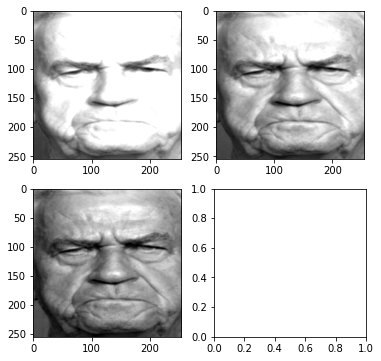

In [ ]:
img, label = train_set[2]
Show_imgs(img, "Numero " + str(label))

Training the model

In [ ]:
model         = CNN(num_classes).to(device)
loss_fn       = nn.CrossEntropyLoss()
optimizer     = torch.optim.Adam(model.parameters(), lr = learning_rate)

print([ e.shape  for e in model.fc.parameters()])

model.fc[0].weight

[torch.Size([64, 512]), torch.Size([64]), torch.Size([16, 64]), torch.Size([16]), torch.Size([6, 16]), torch.Size([6])]


Parameter containing:
tensor([[ 0.0439, -0.0291, -0.0392,  ..., -0.0374, -0.0152, -0.0408],
        [ 0.0412, -0.0430,  0.0310,  ...,  0.0005, -0.0407,  0.0390],
        [ 0.0125, -0.0127,  0.0305,  ...,  0.0267, -0.0325, -0.0135],
        ...,
        [ 0.0060,  0.0327,  0.0238,  ...,  0.0306,  0.0003, -0.0439],
        [-0.0421, -0.0436, -0.0243,  ...,  0.0284, -0.0260,  0.0315],
        [ 0.0144,  0.0193,  0.0406,  ..., -0.0006,  0.0021, -0.0149]],
       device='cuda:0', requires_grad=True)

In [ ]:
model.to('cuda')
lost_list_a = train(model,optimizer,loss_fn,650)

Epoch [1/650], Step [2/2], Loss: 1.7835
Epoch [2/650], Step [2/2], Loss: 1.7597
Epoch [3/650], Step [2/2], Loss: 1.8143
Epoch [4/650], Step [2/2], Loss: 1.8134
Epoch [5/650], Step [2/2], Loss: 1.8086
Epoch [6/650], Step [2/2], Loss: 1.7909
Epoch [7/650], Step [2/2], Loss: 1.8122
Epoch [8/650], Step [2/2], Loss: 1.7956
Epoch [9/650], Step [2/2], Loss: 1.7940
Epoch [10/650], Step [2/2], Loss: 1.7929
Epoch [11/650], Step [2/2], Loss: 1.7958
Epoch [12/650], Step [2/2], Loss: 1.7816
Epoch [13/650], Step [2/2], Loss: 1.7833
Epoch [14/650], Step [2/2], Loss: 1.7874
Epoch [15/650], Step [2/2], Loss: 1.7860
Epoch [16/650], Step [2/2], Loss: 1.8132
Epoch [17/650], Step [2/2], Loss: 1.7840
Epoch [18/650], Step [2/2], Loss: 1.7836
Epoch [19/650], Step [2/2], Loss: 1.7934
Epoch [20/650], Step [2/2], Loss: 1.7777
Epoch [21/650], Step [2/2], Loss: 1.7890
Epoch [22/650], Step [2/2], Loss: 1.7978
Epoch [23/650], Step [2/2], Loss: 1.7804
Epoch [24/650], Step [2/2], Loss: 1.8013
Epoch [25/650], Step [2/2

In [ ]:
test(model)

Test Accuracy: 77.27272727272727 %


[]

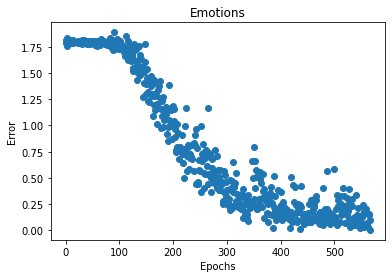

In [ ]:
plt.scatter(range(len(lost_list_a)), lost_list_a)
plt.title("Emotions")
plt.xlabel("Epochs")
plt.ylabel("Error")
plt.plot()

[]

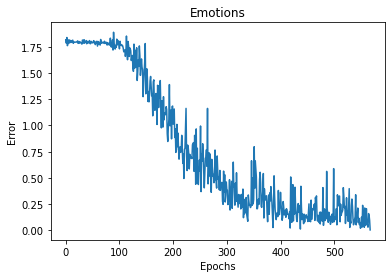

In [ ]:
plt.plot(range(len(lost_list_a)), lost_list_a)
plt.title("Emotions")
plt.xlabel("Epochs")
plt.ylabel("Error")
plt.plot()

In [ ]:
# model.to('cuda')
# train(model,optimizer,loss_fn,700)

In [ ]:
# model.to('cuda')
# test(model)

Prediction and label:  tensor([5])  -  5
layer 1: Convolution output


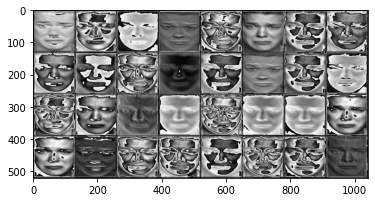

layer 1: Activation function output


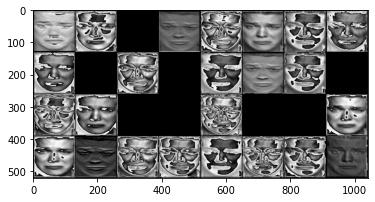

layer 1: Max-Pooling


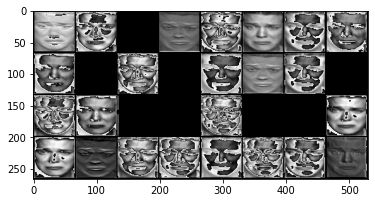

layer 2: Convolution output


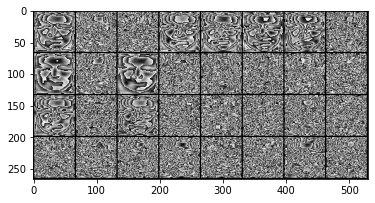

layer 2: Activation function output


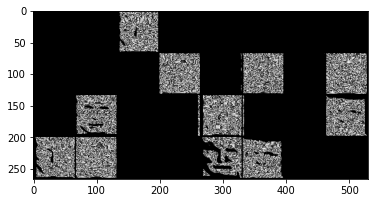

layer 2: Max-Pooling


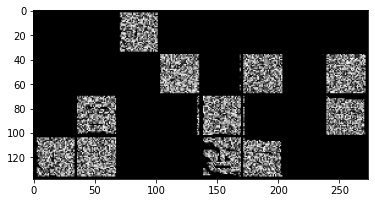

layer 3: Convolution output


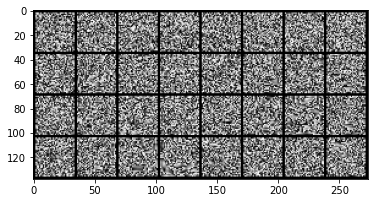

layer 3: Activation function output


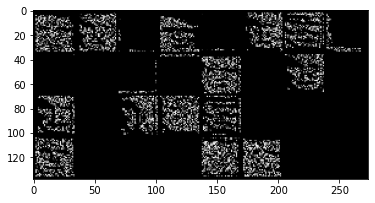

layer 3: Max-Pooling


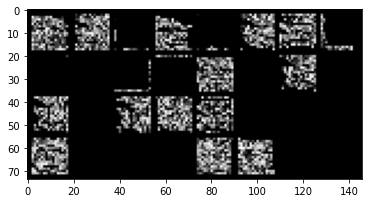

layer 4: Convolution output


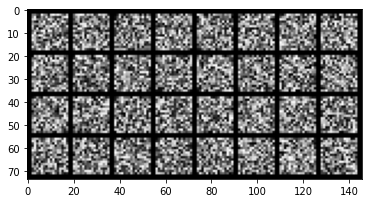

layer 4: Activation function output


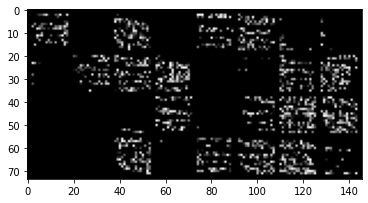

layer 4: Max-Pooling


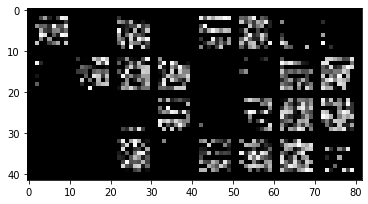

layer 5: Convolution output


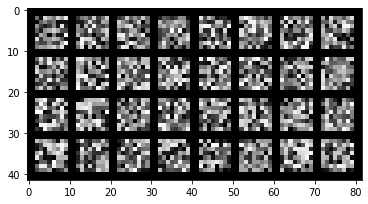

layer 5: Activation function output


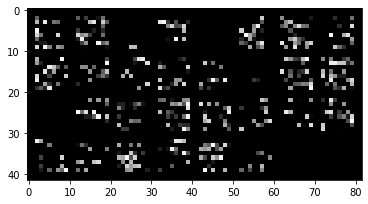

layer 5: Max-Pooling


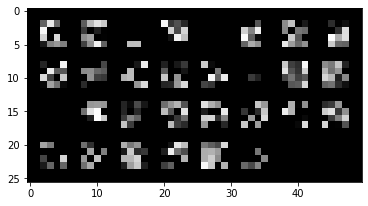

tensor([[ 5.4418,  5.3045,  0.2220, -7.7539,  7.7768, 12.9265]])
Prediction is { tensor([5]) } and label is { 5 }
******************test n° 0**************************


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:61: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


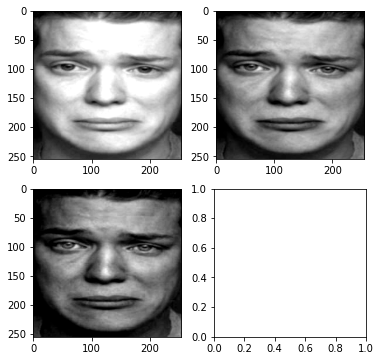

In [ ]:
Softm = torch.nn.Softmax()
n_test = 0

with torch.no_grad():
  model.to('cpu')
  img, label = test_set[n_test]
  img = img.unsqueeze(0)
  out = model(img)
  _, predicted = torch.max(out.data, 1)
  print ('Prediction and label: ',predicted,' - ', label)
  
  out = model.layer1[0](img)
  Show(out, 'layer 1: Convolution output')
  out = model.layer1[1](out)
  Show(out, 'layer 1: Activation function output')
  out = model.layer1[2](out)
  Show(out, 'layer 1: Max-Pooling')
  
  
  out = model.layer2[0](out)
  Show(out, 'layer 2: Convolution output')
  out = model.layer2[1](out)
  Show(out, 'layer 2: Activation function output')
  out = model.layer2[2](out)
  Show(out, 'layer 2: Max-Pooling')

  out = model.layer3[0](out)
  Show(out, 'layer 3: Convolution output')
  out = model.layer3[1](out)
  out = model.layer3[2](out)
  Show(out, 'layer 3: Activation function output')
  out = model.layer3[3](out)
  Show(out, 'layer 3: Max-Pooling')

  out = model.layer4[0](out)
  Show(out, 'layer 4: Convolution output')
  out = model.layer4[1](out)
  out = model.layer4[2](out)
  Show(out, 'layer 4: Activation function output')
  out = model.layer4[3](out)
  Show(out, 'layer 4: Max-Pooling')

  out = model.layer5[0](out)
  Show(out, 'layer 5: Convolution output')
  out = model.layer5[1](out)
  out = model.layer5[2](out)
  Show(out, 'layer 5: Activation function output')
  out = model.layer5[3](out)
  Show(out, 'layer 5: Max-Pooling')

  # out = model.layer6[0](out)
  # Show(out, 'layer 6: Convolution output')
  # out = model.layer6[1](out)
  # Show(out, 'layer 6: Activation function output')
  # out = model.layer6[2](out)
  # Show(out, 'layer 6: Max-Pooling')

  out = out.reshape(out.size(0), -1)
  out = model.fc(out)
  print(out)
  out = Softm(out)
  img, label = test_set[n_test]
  print('Prediction is {',torch.max(out.data, 1)[1],'} and label is {',label,'}')
  name_of_test ="test n° " + str(n_test)
  Show_imgs(img, name_of_test)

In [ ]:
# shutil.rmtree('emociones')

Prediction and label:  tensor([1])  -  0
layer 1: Convolution output


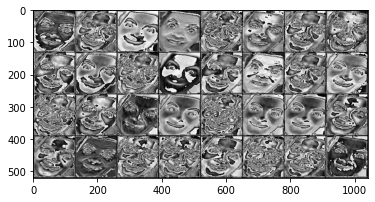

layer 1: Activation function output


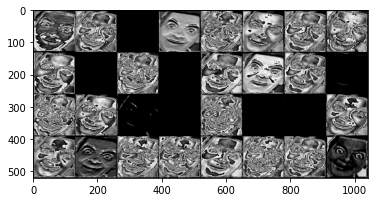

layer 1: Max-Pooling


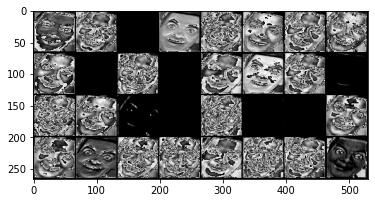

layer 2: Convolution output


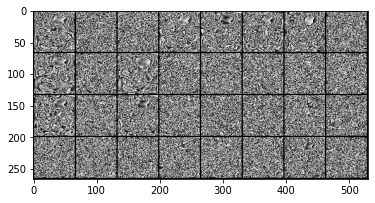

layer 2: Activation function output


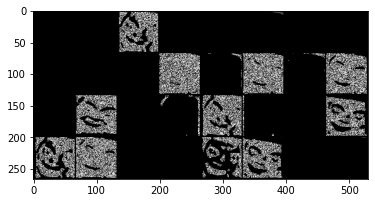

layer 2: Max-Pooling


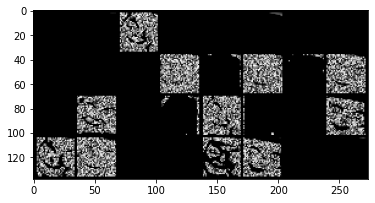

layer 3: Convolution output


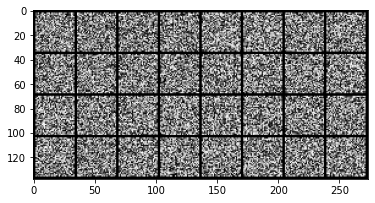

layer 3: Activation function output


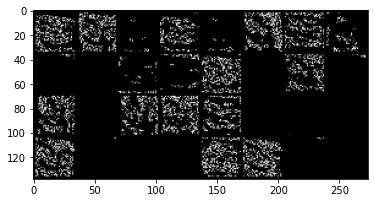

layer 3: Max-Pooling


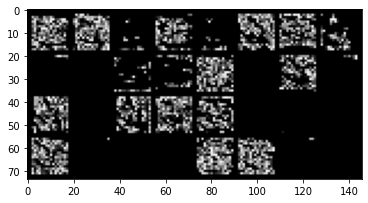

layer 4: Convolution output


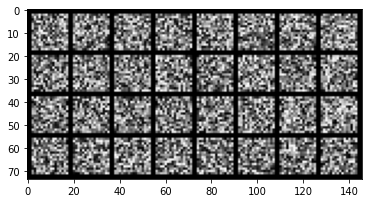

layer 4: Activation function output


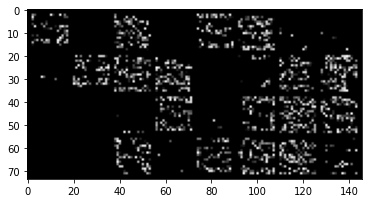

layer 4: Max-Pooling


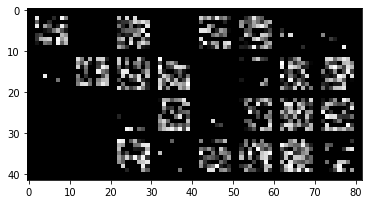

layer 5: Convolution output


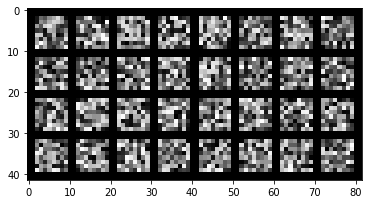

layer 5: Activation function output


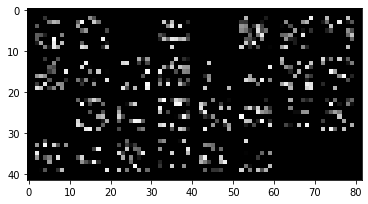

layer 5: Max-Pooling


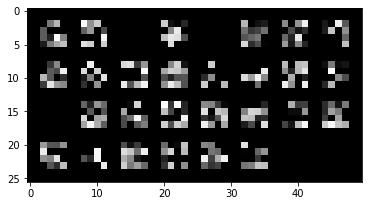

tensor([[-2.6965, 14.8670, 11.4880,  7.8740, -1.3707, 11.4408]],
       grad_fn=<AddmmBackward0>)
******************test n° 0**************************


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:63: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


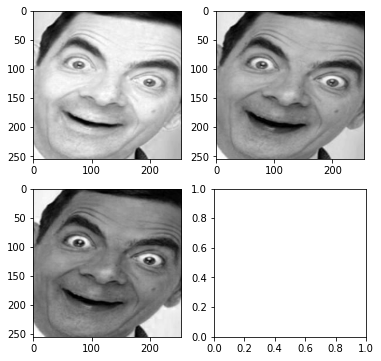

Emotion:  disgust .
Prediction is { tensor([1]) } and label is { 0 }


In [ ]:
validar_imagen('img1.jpg')

Prediction and label:  tensor([1])  -  0
layer 1: Convolution output


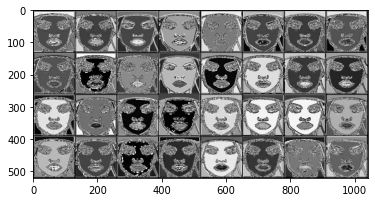

layer 1: Activation function output


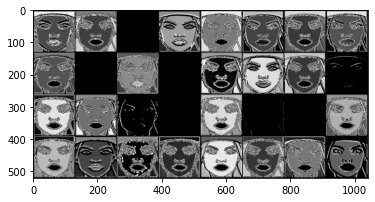

layer 1: Max-Pooling


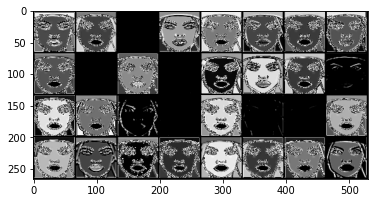

layer 2: Convolution output


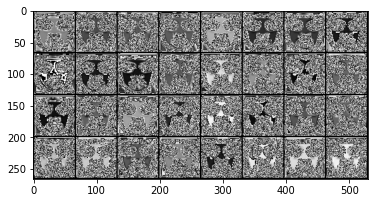

layer 2: Activation function output


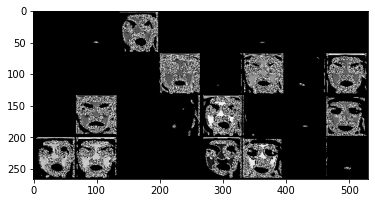

layer 2: Max-Pooling


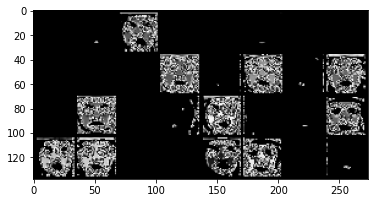

layer 3: Convolution output


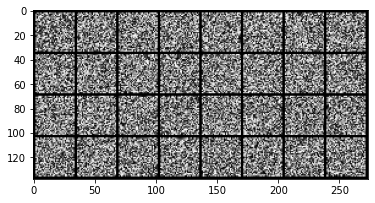

layer 3: Activation function output


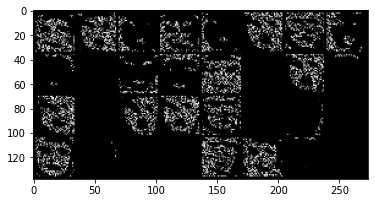

layer 3: Max-Pooling


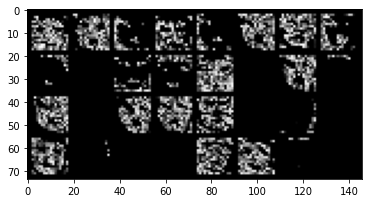

layer 4: Convolution output


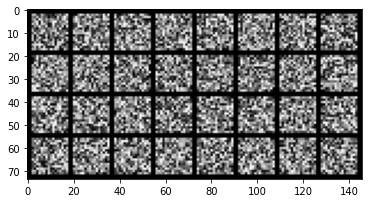

layer 4: Activation function output


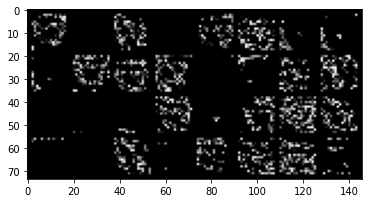

layer 4: Max-Pooling


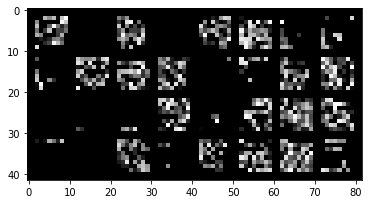

layer 5: Convolution output


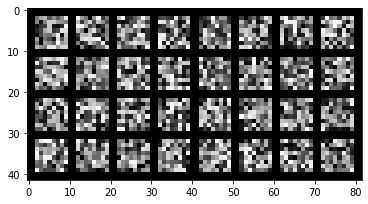

layer 5: Activation function output


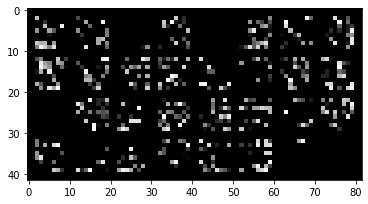

layer 5: Max-Pooling


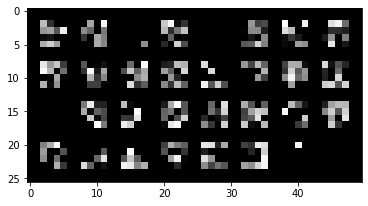

tensor([[-18.8486,  36.3694,  16.2279,  18.1355,  22.1220,   9.8852]],
       grad_fn=<AddmmBackward0>)
******************test n° 0**************************


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:63: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


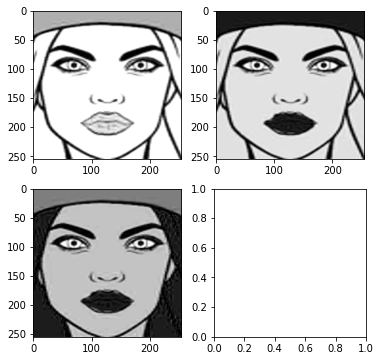

Emotion:  disgust .
Prediction is { tensor([1]) } and label is { 0 }


In [ ]:
validar_imagen('img2.jpg')

Prediction and label:  tensor([2])  -  0
layer 1: Convolution output


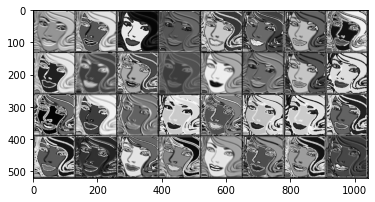

layer 1: Activation function output


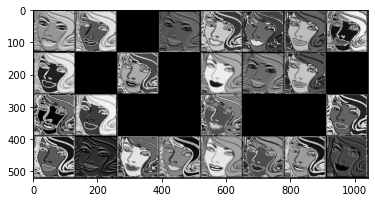

layer 1: Max-Pooling


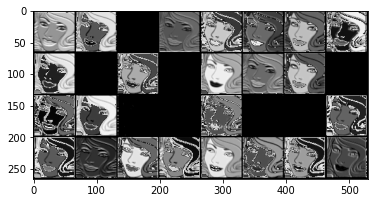

layer 2: Convolution output


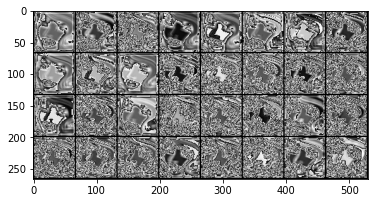

layer 2: Activation function output


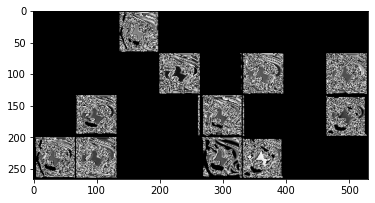

layer 2: Max-Pooling


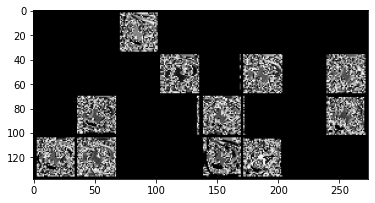

layer 3: Convolution output


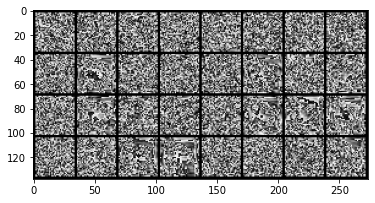

layer 3: Activation function output


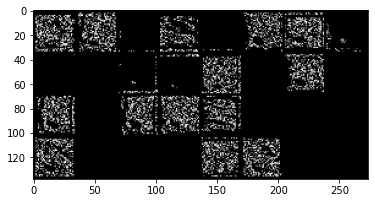

layer 3: Max-Pooling


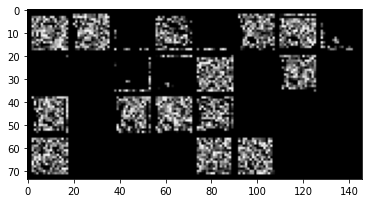

layer 4: Convolution output


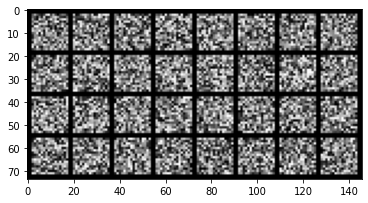

layer 4: Activation function output


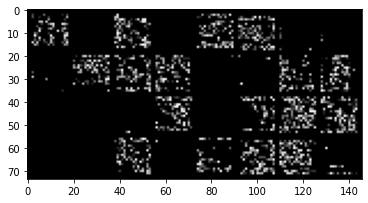

layer 4: Max-Pooling


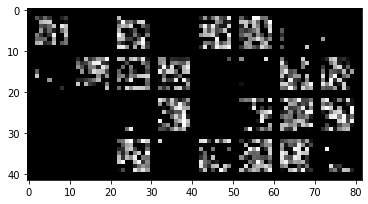

layer 5: Convolution output


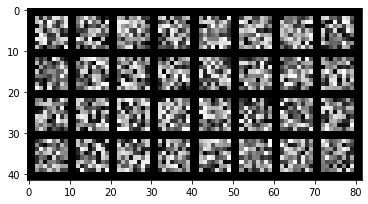

layer 5: Activation function output


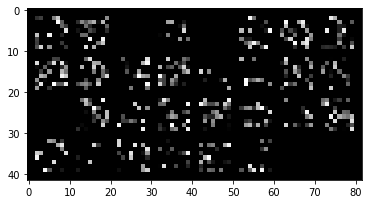

layer 5: Max-Pooling


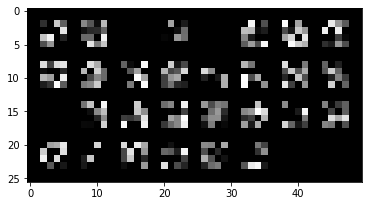

tensor([[-5.3161,  3.7079, 13.8042,  3.2852,  5.2219,  5.6896]],
       grad_fn=<AddmmBackward0>)
******************test n° 0**************************


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:63: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


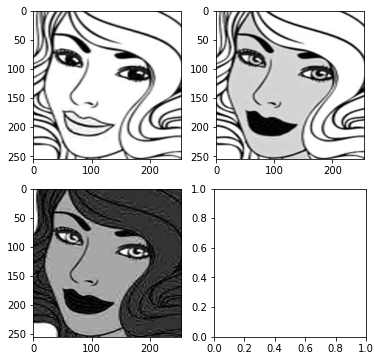

Emotion:  fear .
Prediction is { tensor([2]) } and label is { 0 }


In [ ]:
validar_imagen('img3.jpg')

Prediction and label:  tensor([1])  -  0
layer 1: Convolution output


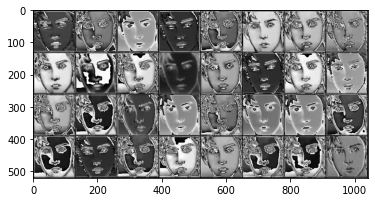

layer 1: Activation function output


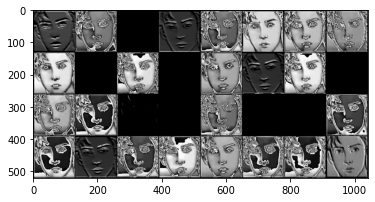

layer 1: Max-Pooling


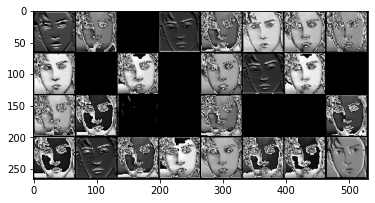

layer 2: Convolution output


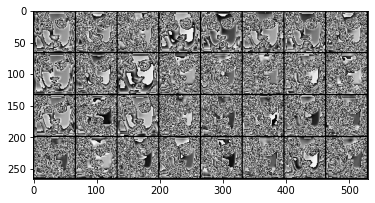

layer 2: Activation function output


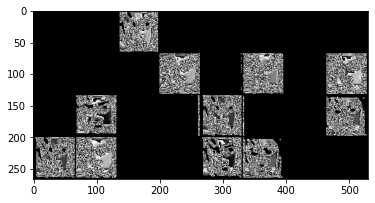

layer 2: Max-Pooling


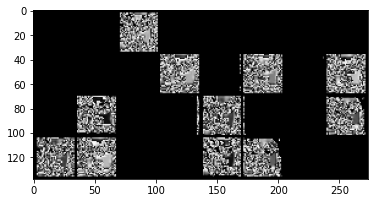

layer 3: Convolution output


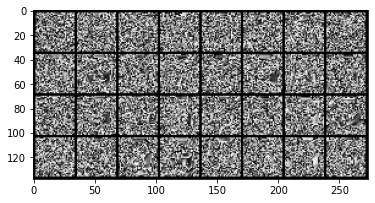

layer 3: Activation function output


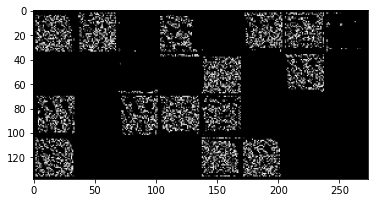

layer 3: Max-Pooling


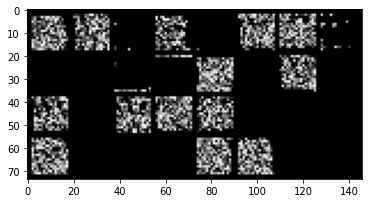

layer 4: Convolution output


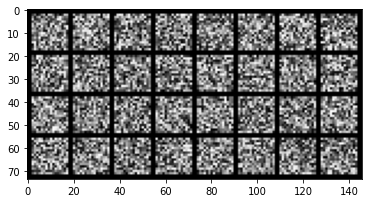

layer 4: Activation function output


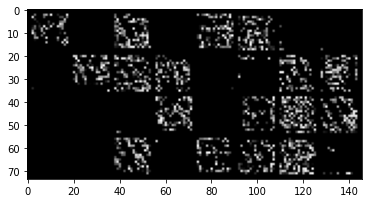

layer 4: Max-Pooling


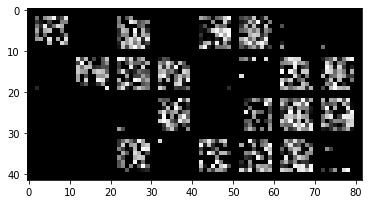

layer 5: Convolution output


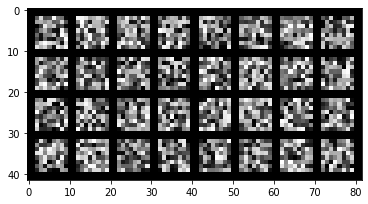

layer 5: Activation function output


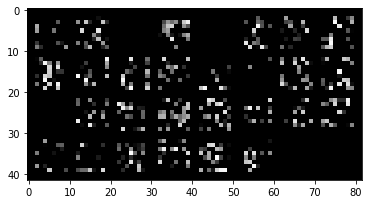

layer 5: Max-Pooling


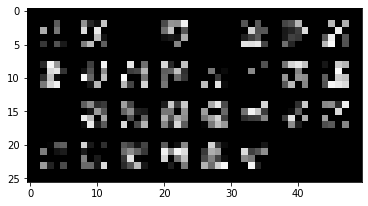

tensor([[12.4113,  9.8839, -4.5284, -9.3070,  2.4179,  9.8789]],
       grad_fn=<AddmmBackward0>)
******************test n° 0**************************


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:63: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


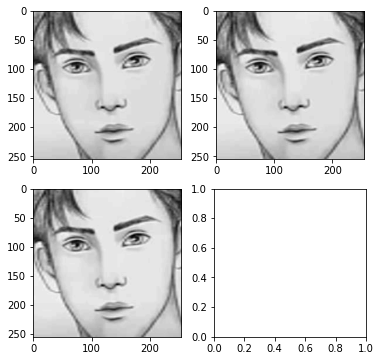

Emotion:  angry .
Prediction is { tensor([0]) } and label is { 0 }


In [ ]:
validar_imagen('img4.jpg')

Prediction and label:  tensor([4])  -  0
layer 1: Convolution output


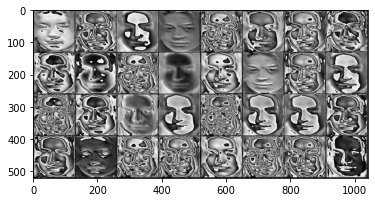

layer 1: Activation function output


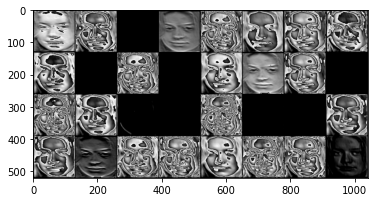

layer 1: Max-Pooling


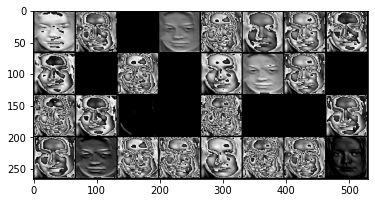

layer 2: Convolution output


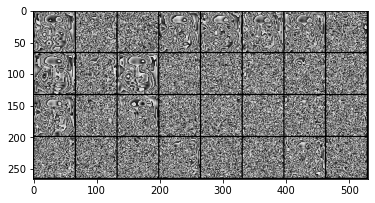

layer 2: Activation function output


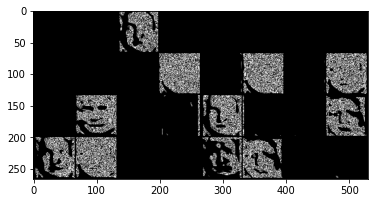

layer 2: Max-Pooling


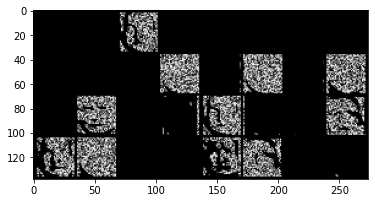

layer 3: Convolution output


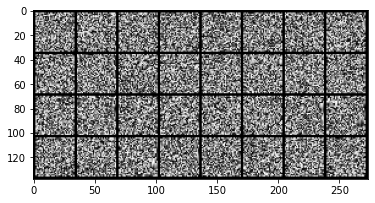

layer 3: Activation function output


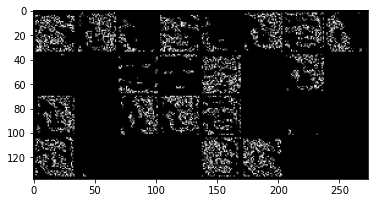

layer 3: Max-Pooling


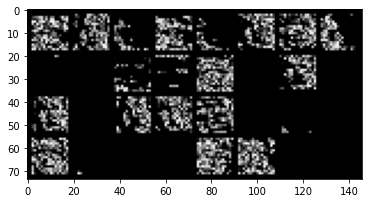

layer 4: Convolution output


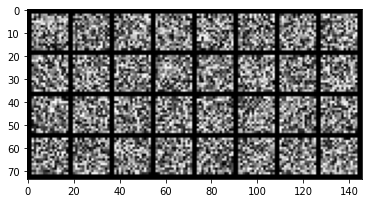

layer 4: Activation function output


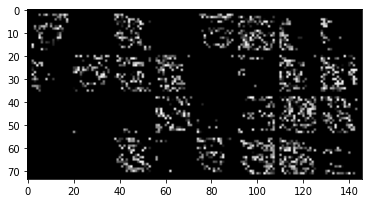

layer 4: Max-Pooling


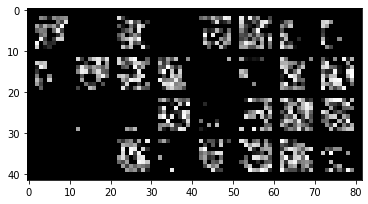

layer 5: Convolution output


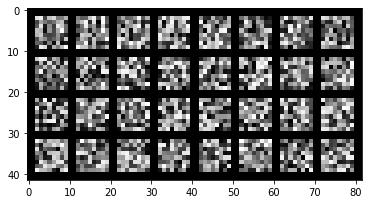

layer 5: Activation function output


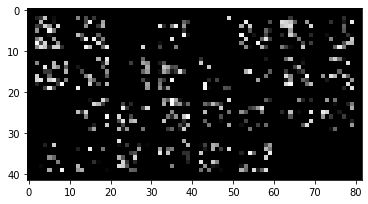

layer 5: Max-Pooling


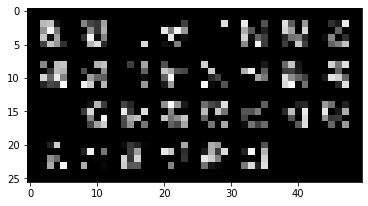

tensor([[ 6.0827, 12.0792,  3.8569, -9.1869, 17.8347, 10.1520]],
       grad_fn=<AddmmBackward0>)
******************test n° 0**************************


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:63: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


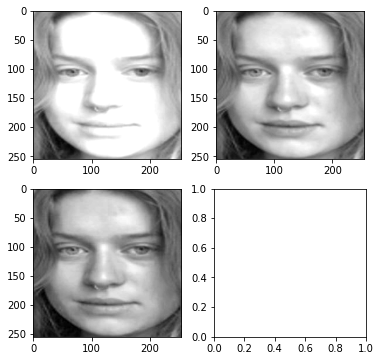

Emotion:  neutral .
Prediction is { tensor([4]) } and label is { 0 }


In [ ]:
validar_imagen('img5.jpg')

Prediction and label:  tensor([0])  -  0
layer 1: Convolution output


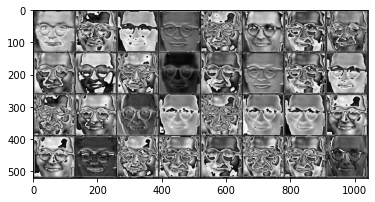

layer 1: Activation function output


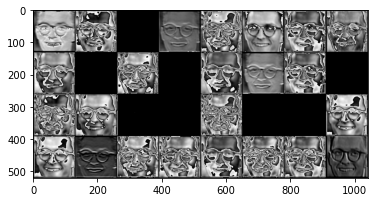

layer 1: Max-Pooling


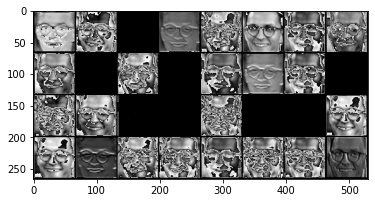

layer 2: Convolution output


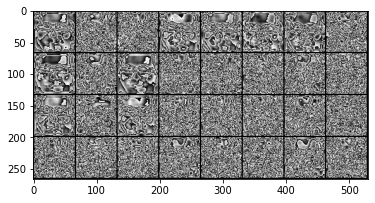

layer 2: Activation function output


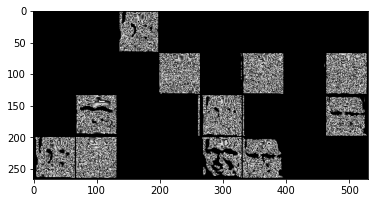

layer 2: Max-Pooling


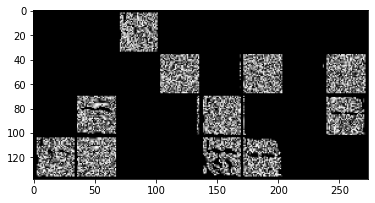

layer 3: Convolution output


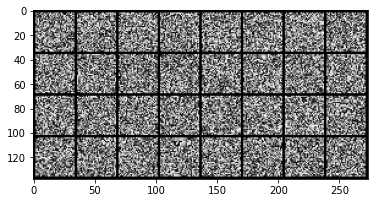

layer 3: Activation function output


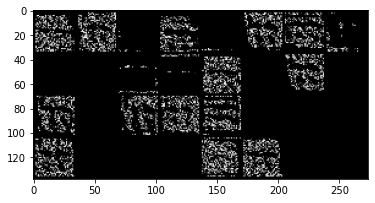

layer 3: Max-Pooling


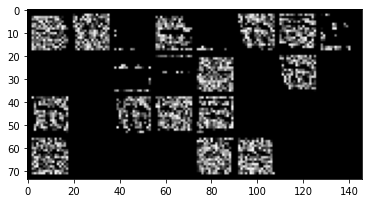

layer 4: Convolution output


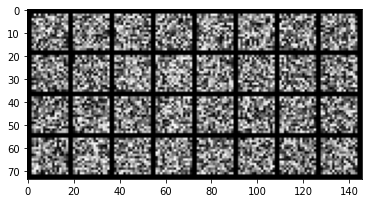

layer 4: Activation function output


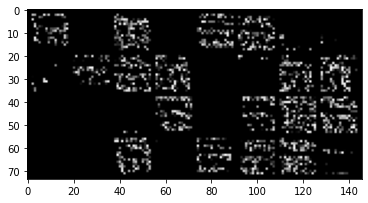

layer 4: Max-Pooling


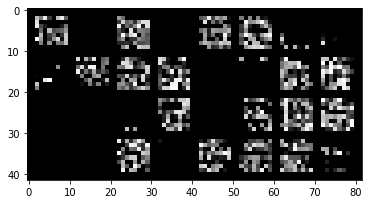

layer 5: Convolution output


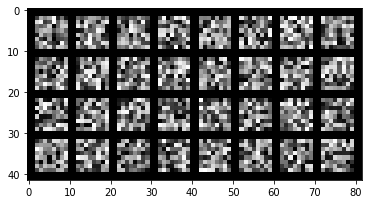

layer 5: Activation function output


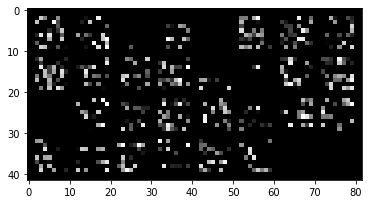

layer 5: Max-Pooling


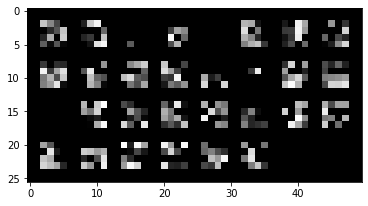

tensor([[15.4028,  7.2073, -9.3125, -2.5130,  1.8956,  7.2788]],
       grad_fn=<AddmmBackward0>)
******************test n° 0**************************


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:63: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


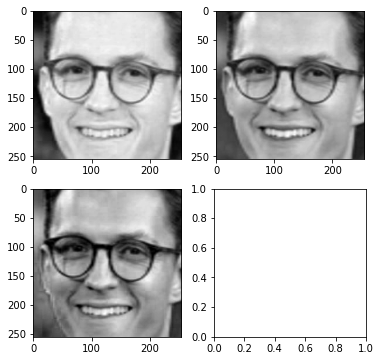

Emotion:  angry .
Prediction is { tensor([0]) } and label is { 0 }


In [ ]:
validar_imagen('img6.jpg')

Prediction and label:  tensor([1])  -  0
layer 1: Convolution output


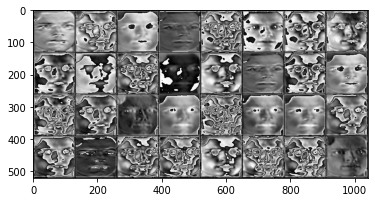

layer 1: Activation function output


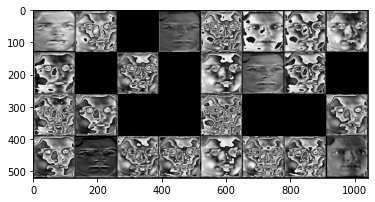

layer 1: Max-Pooling


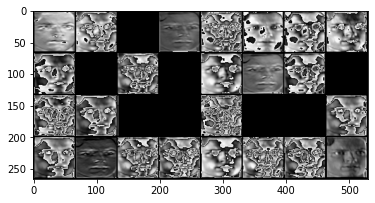

layer 2: Convolution output


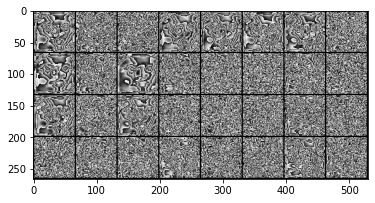

layer 2: Activation function output


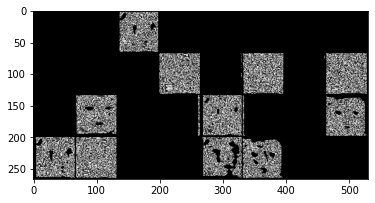

layer 2: Max-Pooling


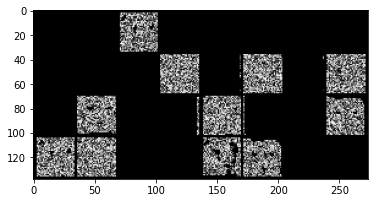

layer 3: Convolution output


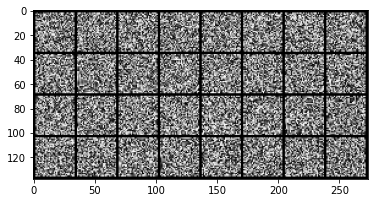

layer 3: Activation function output


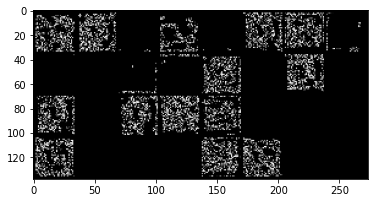

layer 3: Max-Pooling


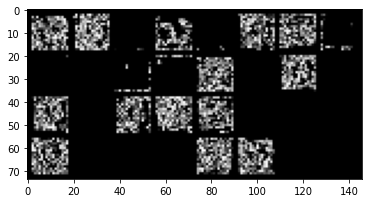

layer 4: Convolution output


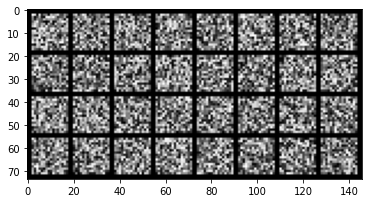

layer 4: Activation function output


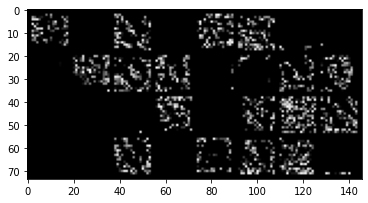

layer 4: Max-Pooling


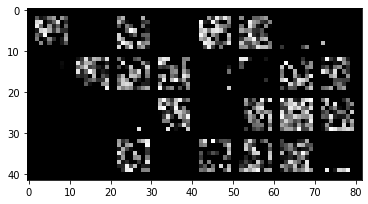

layer 5: Convolution output


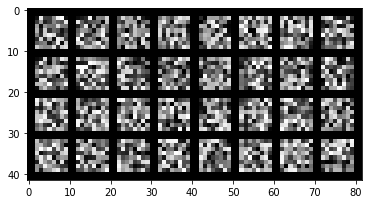

layer 5: Activation function output


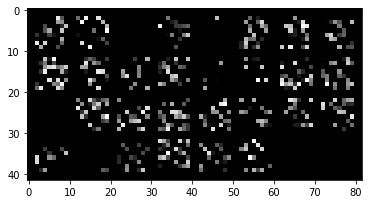

layer 5: Max-Pooling


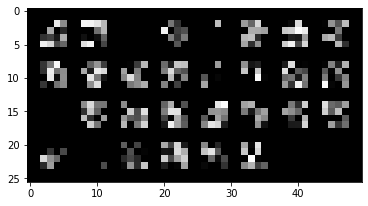

tensor([[-1.2042, 18.2105,  0.3598,  1.4538,  6.5717,  5.4812]],
       grad_fn=<AddmmBackward0>)
******************test n° 0**************************


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:63: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


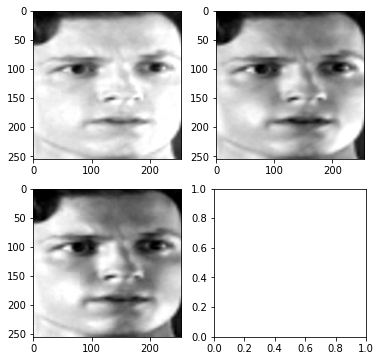

Emotion:  disgust .
Prediction is { tensor([1]) } and label is { 0 }


In [ ]:
validar_imagen('img7.jpg')

Prediction and label:  tensor([5])  -  0
layer 1: Convolution output


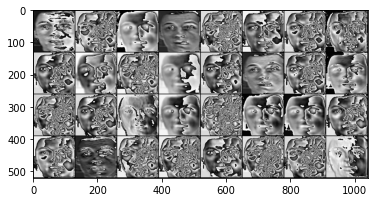

layer 1: Activation function output


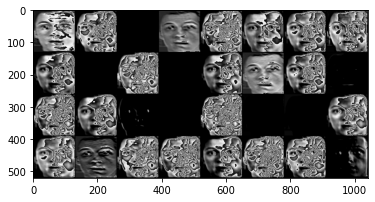

layer 1: Max-Pooling


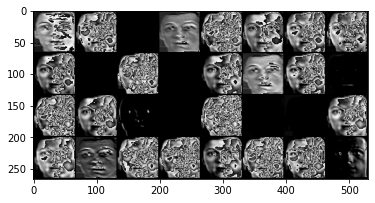

layer 2: Convolution output


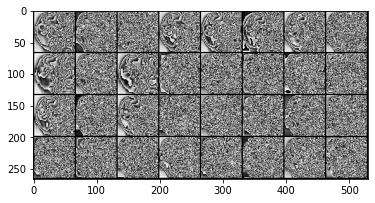

layer 2: Activation function output


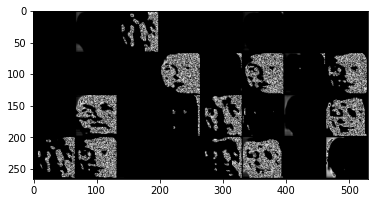

layer 2: Max-Pooling


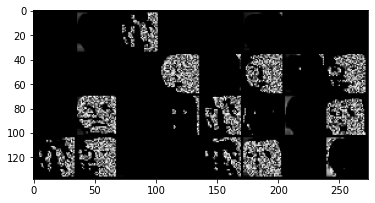

layer 3: Convolution output


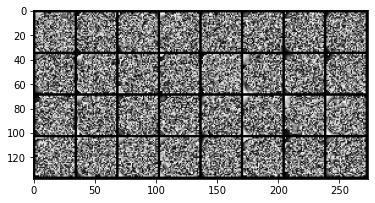

layer 3: Activation function output


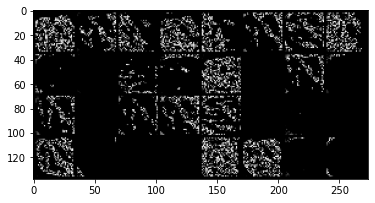

layer 3: Max-Pooling


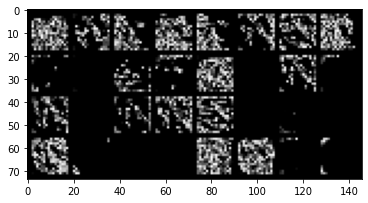

layer 4: Convolution output


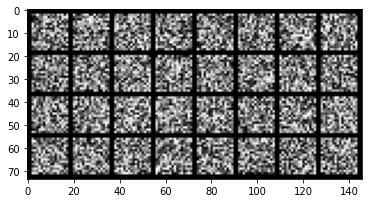

layer 4: Activation function output


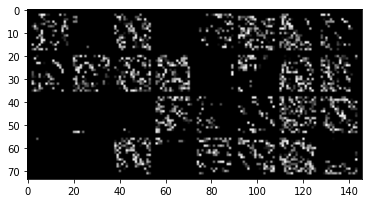

layer 4: Max-Pooling


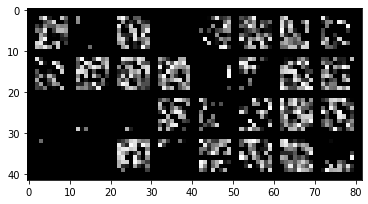

layer 5: Convolution output


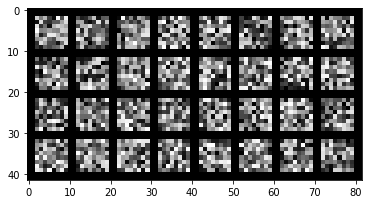

layer 5: Activation function output


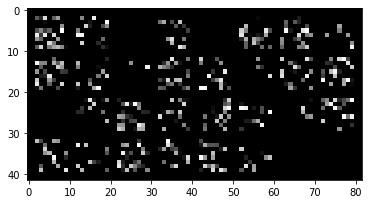

layer 5: Max-Pooling


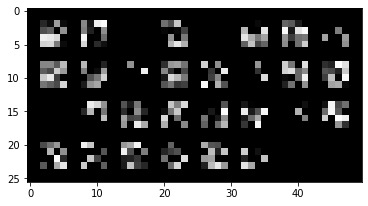

tensor([[  0.8307,  22.0307,   1.9789, -18.0990,   5.6601,  23.7643]],
       grad_fn=<AddmmBackward0>)
******************test n° 0**************************


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:63: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


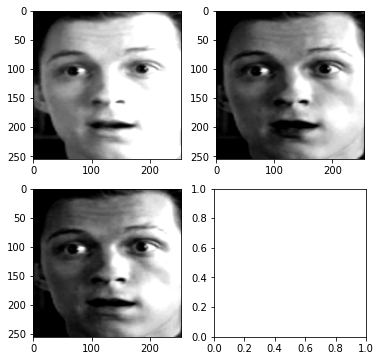

Emotion:  sad .
Prediction is { tensor([5]) } and label is { 0 }


In [ ]:
validar_imagen('img8.jpg')

Prediction and label:  tensor([5])  -  0
layer 1: Convolution output


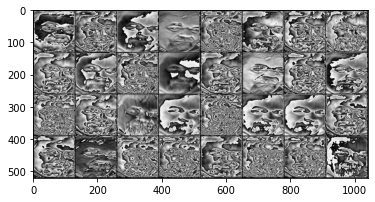

layer 1: Activation function output


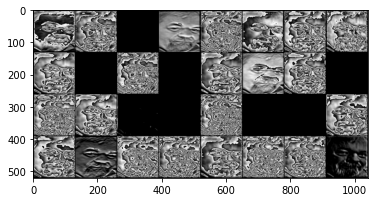

layer 1: Max-Pooling


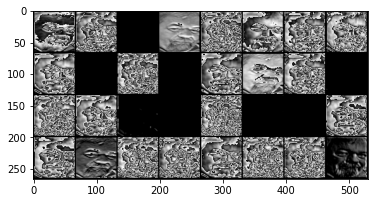

layer 2: Convolution output


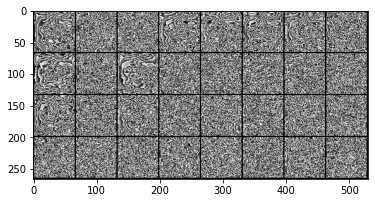

layer 2: Activation function output


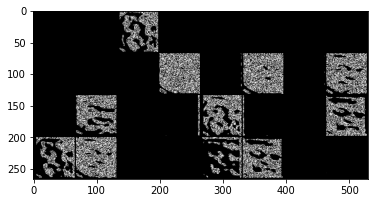

layer 2: Max-Pooling


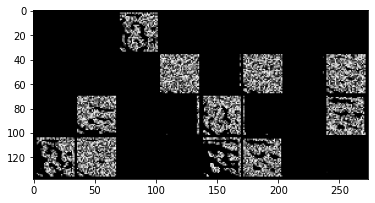

layer 3: Convolution output


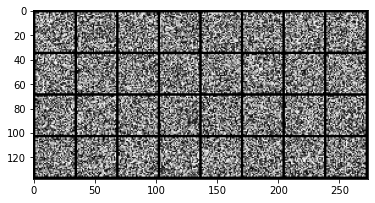

layer 3: Activation function output


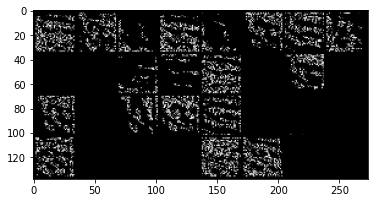

layer 3: Max-Pooling


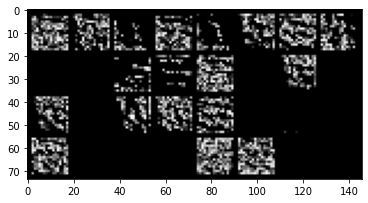

layer 4: Convolution output


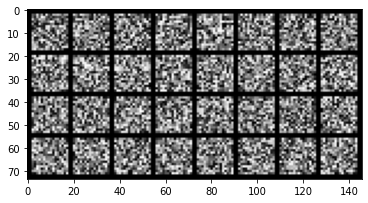

layer 4: Activation function output


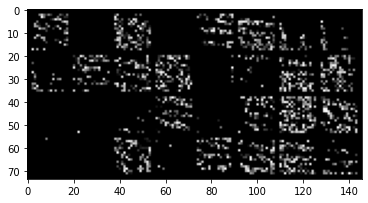

layer 4: Max-Pooling


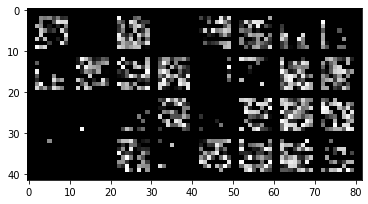

layer 5: Convolution output


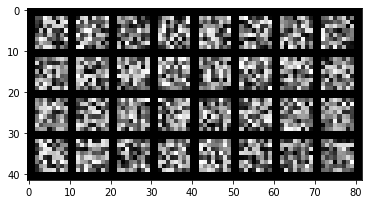

layer 5: Activation function output


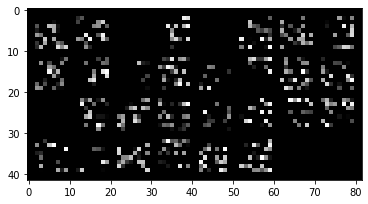

layer 5: Max-Pooling


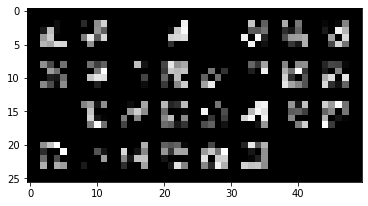

tensor([[ 9.7081, 11.4508, -7.7832, -6.5464, -1.1405, 18.2137]],
       grad_fn=<AddmmBackward0>)
******************test n° 0**************************


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:63: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


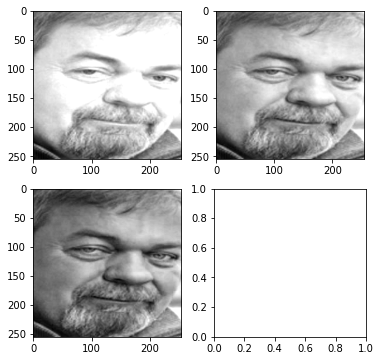

Emotion:  sad .
Prediction is { tensor([5]) } and label is { 0 }


In [ ]:
validar_imagen('img8.jpeg')